## Лабораторная работа №1 Исследование датасета

### Сегментатор растений

In [ ]:
import os
import re
from datetime import datetime

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from skimage.measure import label
from scipy.ndimage import gaussian_filter

Построим временной ряд заполнения изображения листвой

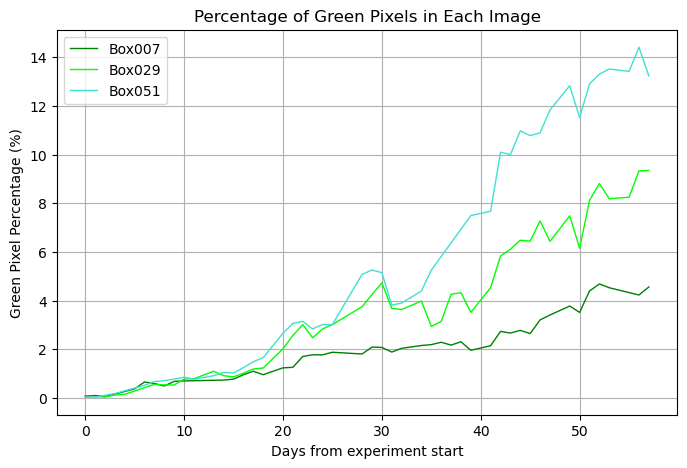

In [86]:
image_folder = 'data/masks'
green_color = [0x78, 0xC8, 0x14]
total_pixels = None

filenames = os.listdir(image_folder)
filenames.sort()

box_prefixes = ['Box007', 'Box029', 'Box051']
box_colors = {'Box007': 'green', 'Box029': 'lime', 'Box051': 'turquoise'}

box_green_percentages = {}
box_images = {}

plt.figure(figsize=(8, 5))
plt.xlabel("Days from experiment start")
plt.ylabel("Green Pixel Percentage (%)")
plt.title("Percentage of Green Pixels in Each Image")
plt.grid(True)

date_rx = r'\d{4}-\d{2}-\d{2}'

for box_prefix in box_prefixes:
    images = {}
    green_percentages = {}
    min_date = datetime.strptime(re.search(date_rx, filenames[0]).group(), "%Y-%m-%d")
    for filename in filenames:
        if box_prefix in filename:
            date = datetime.strptime(re.search(date_rx, filename).group(), "%Y-%m-%d")
            date_delta = date - min_date
            image_path = os.path.join(image_folder, filename)
            image = Image.open(image_path).convert("RGB")
            images[date_delta.days] = image
    
    box_images[box_prefix] = images

    for image_key in images.keys():
        pixels = np.array(images[image_key])

        if total_pixels is None: total_pixels = pixels.shape[0] * pixels.shape[1]
        green_pixels = np.sum(np.all(pixels == green_color, axis=-1))

        green_percentage = (green_pixels / total_pixels) * 100
        green_percentages[image_key] = green_percentage
    
    box_green_percentages[box_prefix] = green_percentages

    plt.plot(green_percentages.keys(), green_percentages.values(), color=box_colors[box_prefix], linestyle='-', linewidth=1,
             label=box_prefix)
    
plt.legend(loc='upper left')
plt.show()

Проделаем экспоненциальную экстраполяцию и определим, через сколько дней после начала эксперимента каждое из растений займет всю площадь

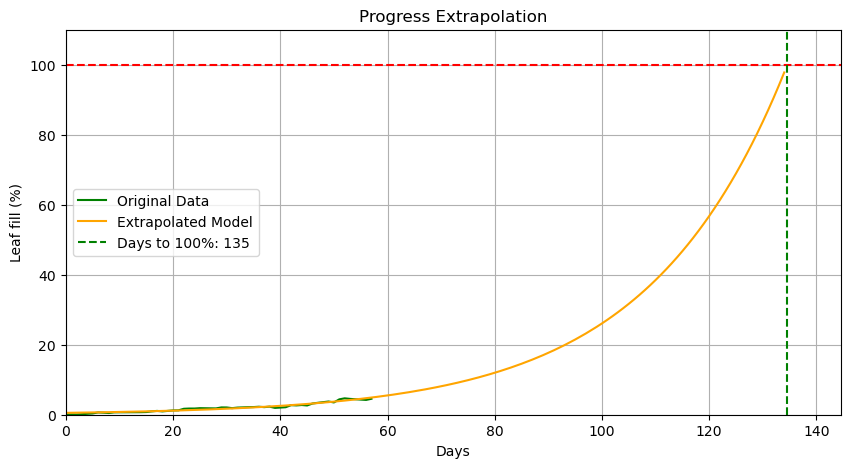

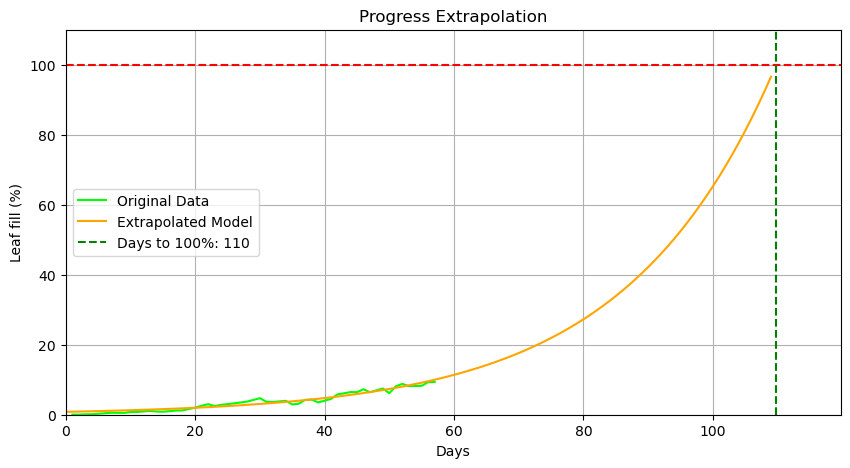

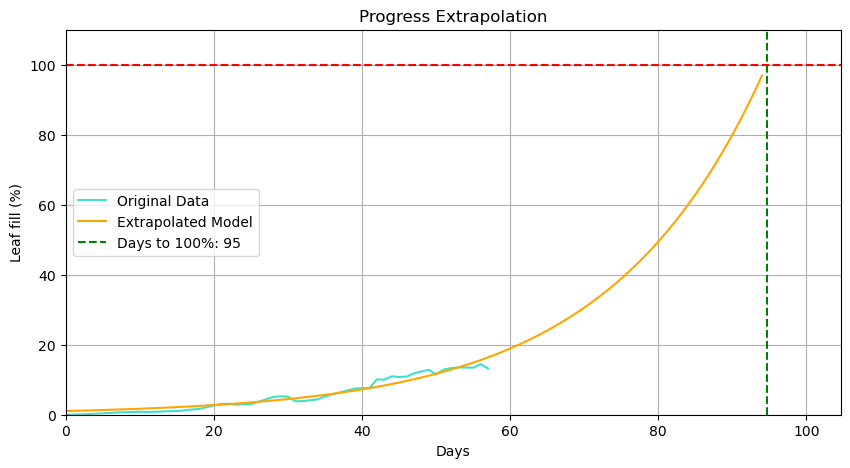

In [87]:
for box_prefix in box_prefixes:
    green_percentages = box_green_percentages[box_prefix]
    x_data = np.array(list(green_percentages.keys()))
    y_data = np.array(list(green_percentages.values()))
    
    def exponential_model(x, a, b):
        return a * np.exp(b * x)
    
    params, covariance = curve_fit(exponential_model, x_data, y_data, p0=(1, 0.1))    
    time_to_100 = np.log(100 / params[0]) / params[1]    
    x_extrapolated = np.arange(0, time_to_100, 1)  # Extend the x-axis for extrapolation
    y_extrapolated = exponential_model(x_extrapolated, *params)
    
    plt.figure(figsize=(10, 5))
    plt.plot(x_data, y_data, '-', label='Original Data', color=box_colors[box_prefix])
    plt.plot(x_extrapolated, y_extrapolated, '-', label='Extrapolated Model', color='orange')
    plt.axhline(y=100, color='red', linestyle='--')
    plt.axvline(x=time_to_100, color='green', linestyle='--', label=f'Days to 100%: {time_to_100:.0f}')
    plt.title('Progress Extrapolation')
    plt.xlabel('Days')
    plt.ylabel('Leaf fill (%)')
    plt.legend()
    plt.grid()
    plt.xlim(0, time_to_100 + 10)
    plt.ylim(0, 110)
    plt.show()

Построим HeatMap, чтобы увидеть, как распространяются листья

К сожалению, картинки не позиционированы относительно друг друга, поэтому карта не будет точной

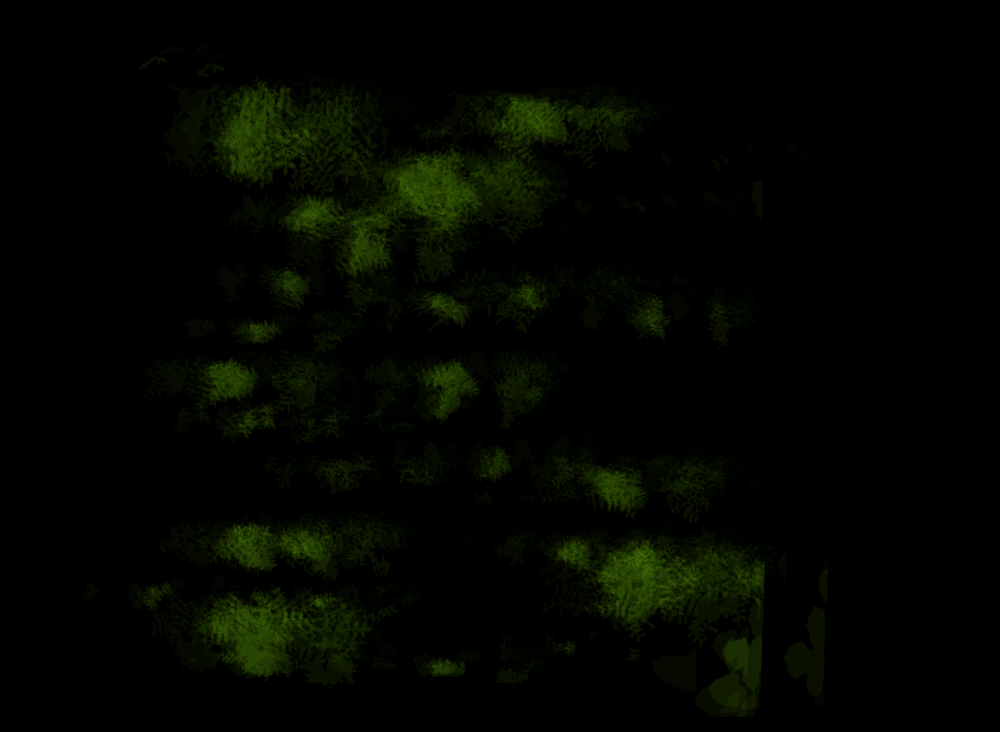

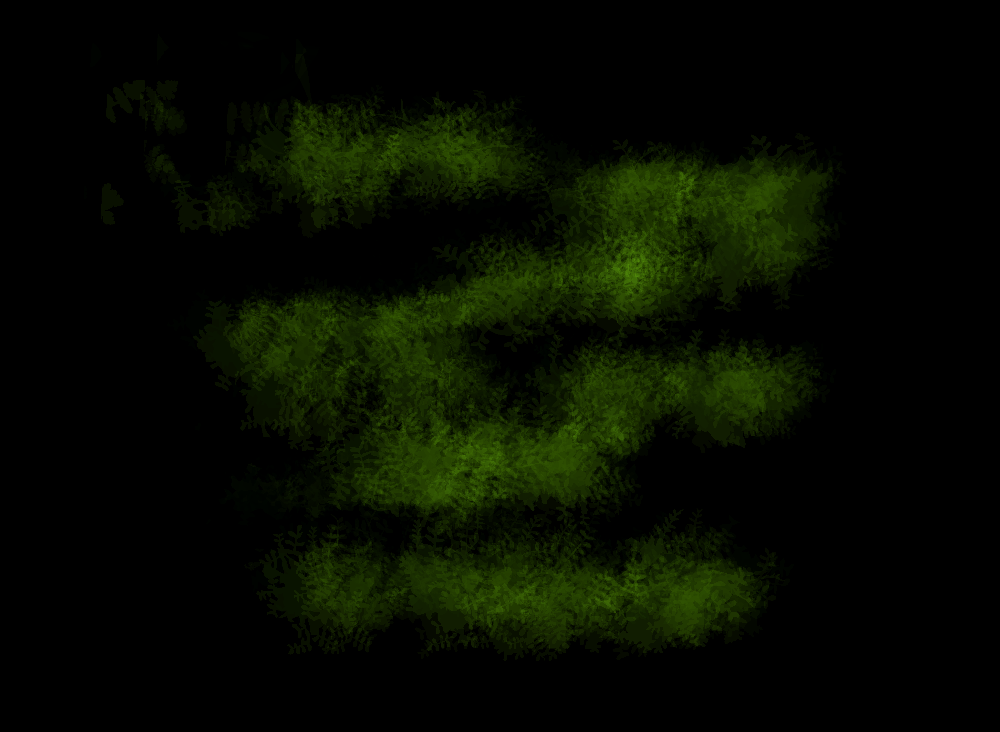

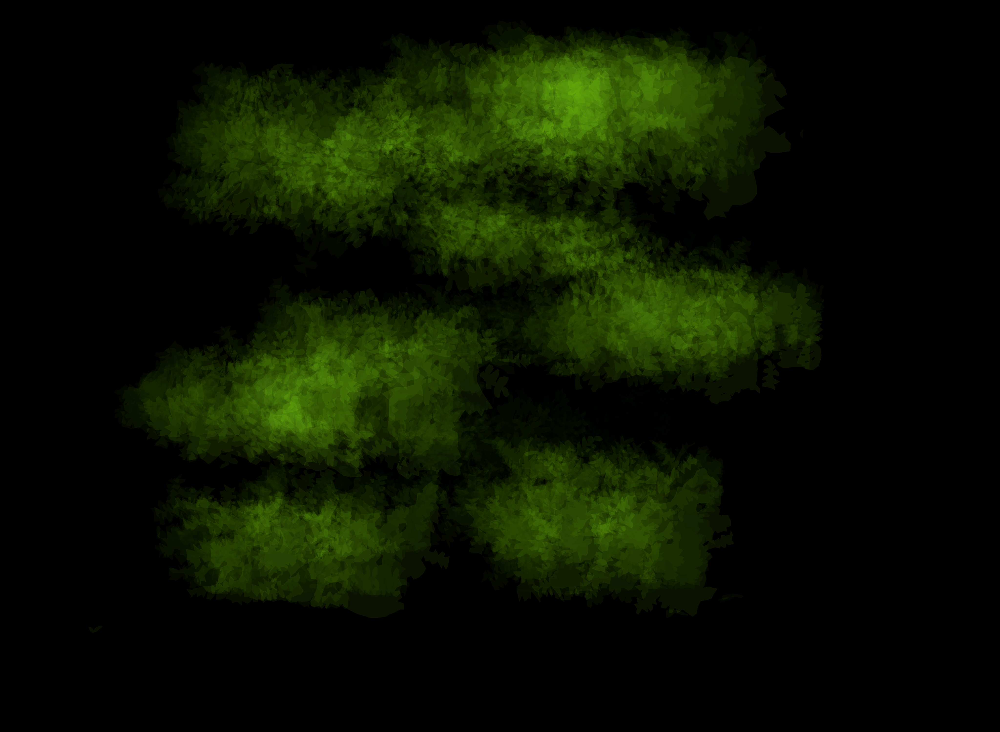

In [114]:
for box_prefix in box_prefixes:
    images = box_images[box_prefix]
    blend = images[1]
    blend_c = 1 / len(images) + 0.07 # Magic number, just to get more rich color
    
    for image in images.values():
        blend = Image.blend(blend, image, blend_c)
    
    display(blend)

Посчитаем также, сколько отдельных кластеров (независимых ростков) образуется со временем

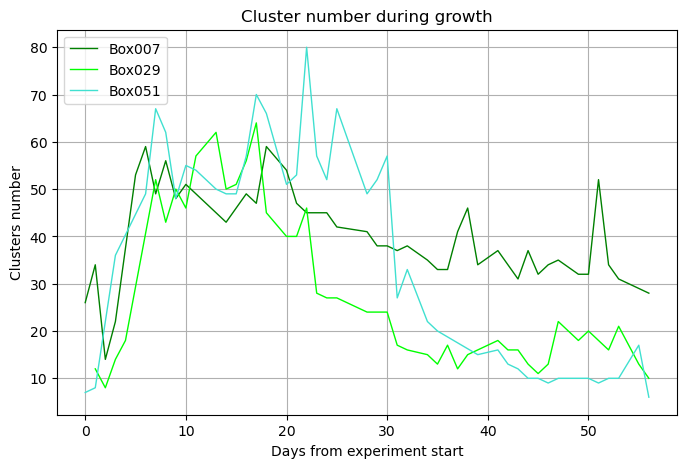

In [115]:
plt.figure(figsize=(8, 5))
plt.xlabel("Days from experiment start")
plt.ylabel("Clusters number")
plt.title("Cluster number during growth")
plt.grid(True)

box_clusters = {}

for box_prefix in box_prefixes:
    clusters = {}
    for item, image in box_images[box_prefix].items():
        img_array = np.array(image)
        green_mask = (img_array[:, :, :] == green_color)
        labeled_array, num_features = label(green_mask, connectivity=2, return_num=True)
        clusters[item] = num_features

    box_clusters[box_prefix] = clusters

    plt.plot(list(clusters.keys())[:-1], list(clusters.values())[:-1], color=box_colors[box_prefix], linestyle='-', linewidth=1,
             label=box_prefix)
    
plt.legend(loc='upper left')
plt.show()

Усредним график количества кластеров, чтобы получить результаты с меньшим количеством выбросов

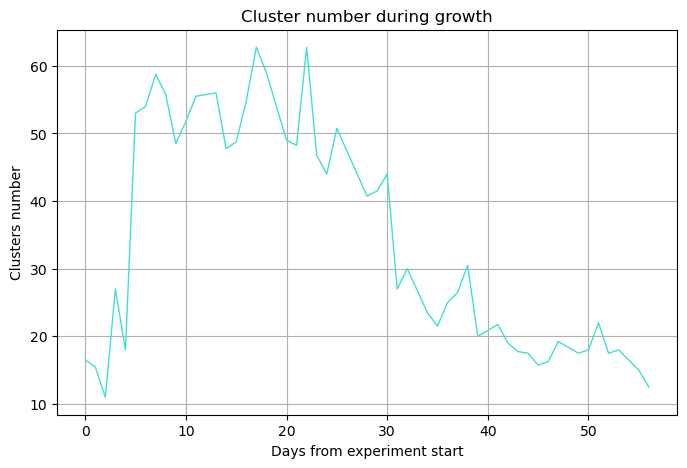

In [124]:
result_clusters = {}

for current_map in box_clusters.values():
    for key, value in current_map.items():
        if key in result_clusters:
            result_clusters[key] = (result_clusters[key] + value) / 2
        else:
            result_clusters[key] = value
            
result_keys = list(result_clusters.keys())
result_keys.sort()
result_keys = result_keys[:-1]

result_values = list(map(lambda x: result_clusters[x], result_keys))

plt.figure(figsize=(8, 5))
plt.xlabel("Days from experiment start")
plt.ylabel("Clusters number")
plt.title("Cluster number during growth")
plt.grid(True)
plt.plot(result_keys, result_values, color='turquoise', linestyle='-', linewidth=1)
plt.show()

Посчитаем корреляцию и поймем, что количество кластеров не зависит от дня эксперимента, хоть и имеет сильную связанность


In [128]:
correlation_matrix = np.corrcoef(result_keys, result_values)
correlation = correlation_matrix[0, 1]
correlation

-0.5753716017096043

Посчитаем медиану количества кластеров

В датасете указано, что в каждом контейнере вплоть до 40 семян

Будем считать, что проросло 27 из сорока семян, то есть коэффициент прорастания 0.675

In [130]:
median = np.median(result_values)
median

27.0

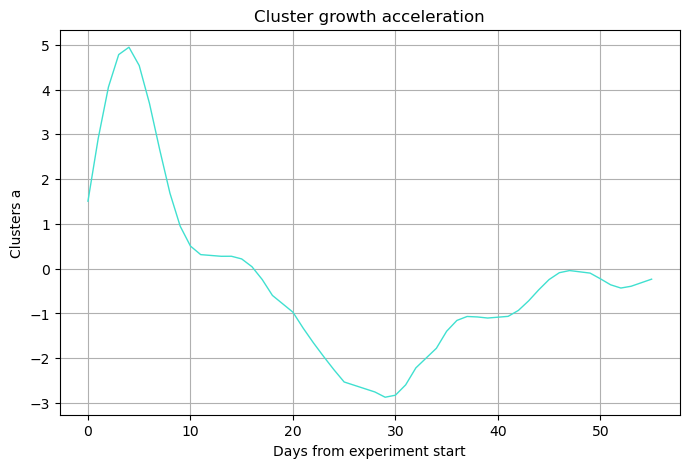

In [151]:
def moving_average(arr, window_size):
    return np.convolve(arr, np.ones(window_size)/window_size, mode='valid')

def gaussian_smoothing(arr, sigma):
    return gaussian_filter(arr, sigma=sigma)

smoothed_values = gaussian_smoothing(result_values, sigma=3)

derivative = []
for i in range(1, len(smoothed_values)):
    derivative.append(smoothed_values[i] - smoothed_values[i - 1])
    
plt.figure(figsize=(8, 5))
plt.xlabel("Days from experiment start")
plt.ylabel("Clusters a")
plt.title("Cluster growth acceleration")
plt.grid(True)
plt.plot(result_keys[:-1], derivative, color='turquoise', linestyle='-', linewidth=1)
plt.show()

Из сглаженного графика производной видим, что наибольшее прорастание наблюдается в дни около пятого

In [155]:
max_index = np.argmax(derivative)
result_keys[max_index]

4

Итого наибольшее количество прорастаний на четвертый день эксперимента